**Exploratory Data Analysis**  
**Author: Ramesh Bhatta, CIS, RIT**

In [1]:
## Importing Packages

import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure
from scipy.stats import gaussian_kde
import seaborn as sns 
import cmocean
import pandas as pd

In [2]:
## Predefined plot preferences--> This is my usual plot preference

# Define text sizes
SMALL_SIZE = 14
MEDIUM_SIZE = 16
BIGGER_SIZE = 18

# Apply text size settings
plt.rc('font', size=SMALL_SIZE)          # Default font size
plt.rc('axes', titlesize=MEDIUM_SIZE)   # Axis title font size
plt.rc('axes', labelsize=MEDIUM_SIZE)   # Axis labels font size
plt.rc('xtick', labelsize=SMALL_SIZE)   # X-axis tick label font size
plt.rc('ytick', labelsize=SMALL_SIZE)   # Y-axis tick label font size
plt.rc('legend', fontsize=SMALL_SIZE)   # Legend font size
plt.rc('figure', titlesize=BIGGER_SIZE) # Figure title font size

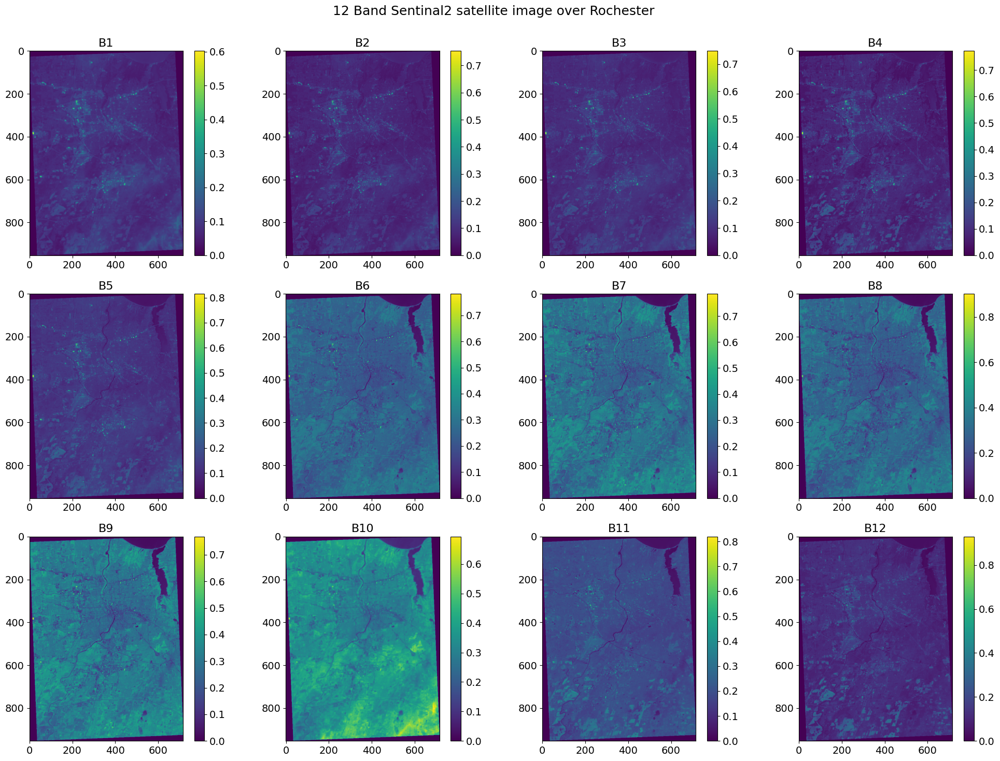

In [3]:
## 1.1 Read the sentinal2 data --> .npy format

Sen2_roc = np.load('./sentinel2_rochester.npy')

## Plot all Bands
fig, axs = plt.subplots(3, 4, figsize=(20, 15))

# For 12 Bands
for i in range(12):
    
    ax = axs[i // 4, i % 4] 
    cax = ax.imshow(Sen2_roc[:, :, i], cmap='viridis')  
    ax.set_title(f'B{i+1}')
    fig.colorbar(cax, ax=ax, orientation='vertical')

# Tight Layout
plt.suptitle('12 Band Sentinal2 satellite image over Rochester\n')
plt.tight_layout()
plt.show()

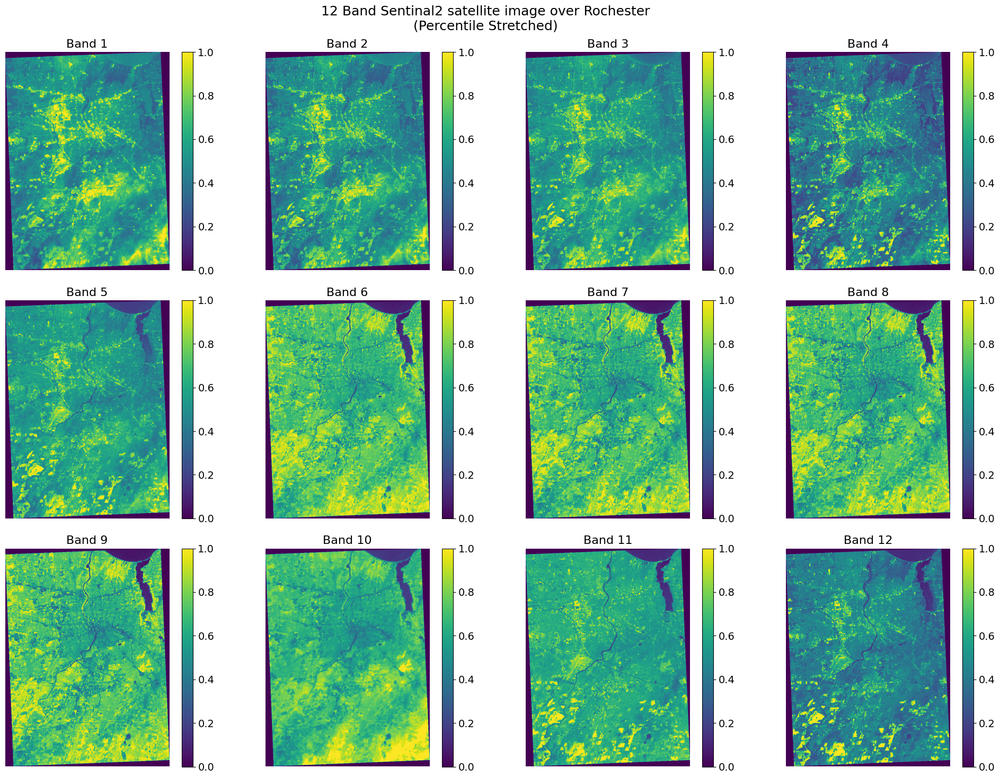

In [4]:
## 1.2 Using Percentile stretching for contrast enhancement

# Function to apply percentile stretching 
def percentile_stretch(band):
    p2, p98 = np.nanpercentile(band, (2, 98))
    band = np.clip(band, p2, p98)
    return (band - p2) / (p98 - p2)

# Plot all bands
fig, axes = plt.subplots(3, 4, figsize=(20, 15))

# intialize stretched output bands
stretched_bands = np.zeros_like(Sen2_roc)

# Loop through the 12 bands 
for i in range(3):
    for j in range(4):
        band_idx = i * 4 + j
        if band_idx < Sen2_roc.shape[2]:  

            band = Sen2_roc[:, :, band_idx]
            
            # Band Stretching
            stretched_band = percentile_stretch(band)

            # Save the band stretched data
            stretched_bands[:, :, band_idx] = stretched_band

            # Plot each band
            ax = axes[i, j]
            cax = ax.imshow(stretched_band, cmap='viridis')  
            ax.set_title(f'Band {band_idx+1}')
            ax.axis('off')  
            fig.colorbar(cax, ax=ax, orientation='vertical')

# Tight layout
plt.suptitle('12 Band Sentinal2 satellite image over Rochester\n(Percentile Stretched)')
plt.tight_layout()
plt.show()


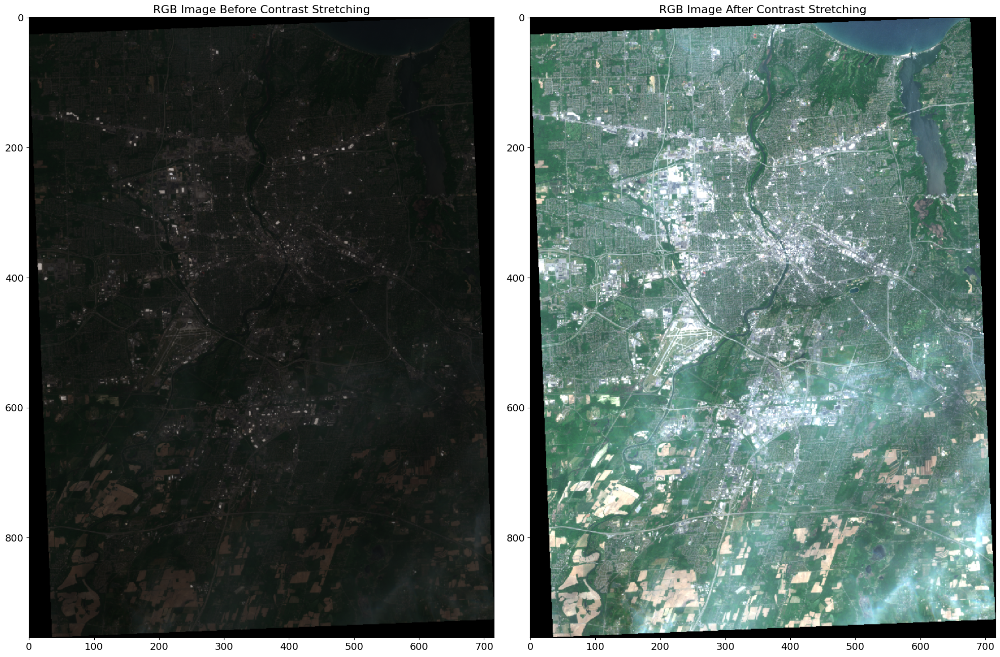

In [5]:
## 1.3 Before and After stretching

# Before stretch
b_before = Sen2_roc[:, :, 1]  
g_before = Sen2_roc[:, :, 2]  
r_before = Sen2_roc[:, :, 3]  

# Combine the bands
rgb_before = np.stack((r_before, g_before, b_before), axis=-1)

# Apply histogram stretching to the bands
b_after = stretched_bands[:, :, 1]
g_after = stretched_bands[:, :, 2]
r_after = stretched_bands[:, :, 3]

# Combine the three bands to form an RGB image after stretching
rgb_after = np.stack((r_after, g_after, b_after), axis=-1)

# Plot the Images
fig, axes = plt.subplots(1, 2, figsize=(20, 15))

axes[0].imshow(rgb_before)
axes[0].set_title("RGB Image Before Contrast Stretching")
axes[1].imshow(rgb_after)
axes[1].set_title("RGB Image After Contrast Stretching")

# Show the plot
plt.tight_layout()
plt.show()

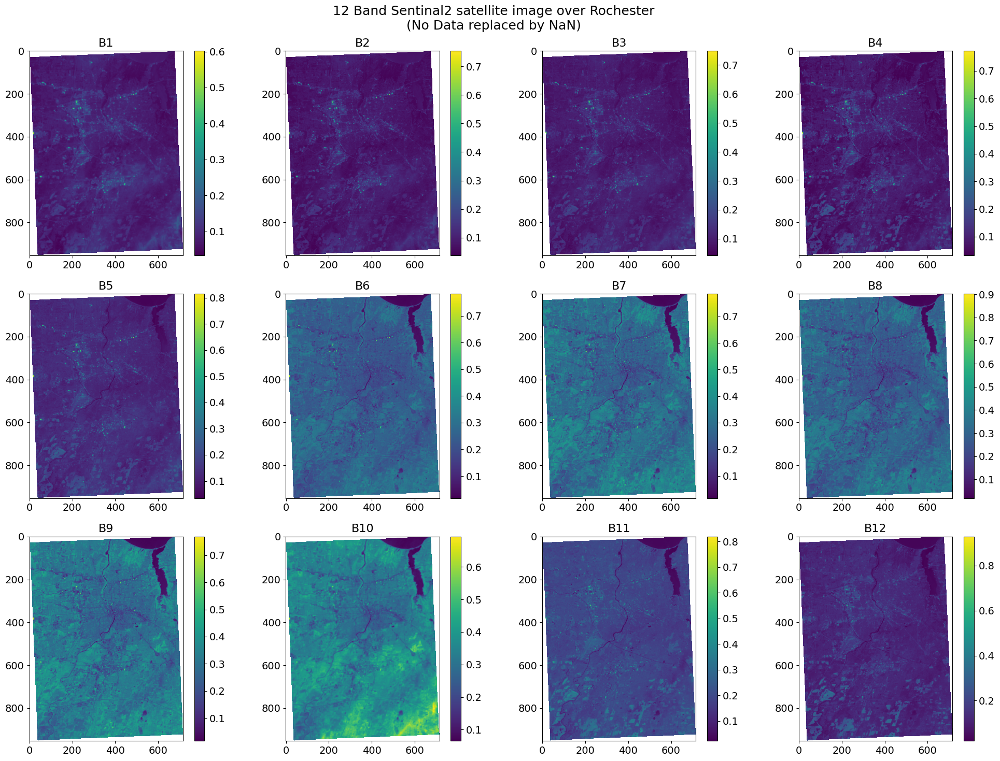

In [6]:
## 1.4 set the no data pixels (pixel with zero values to nan)

Sen2roc_nanadded = np.copy(Sen2_roc) 
Sen2roc_nanadded[Sen2_roc == 0] = np.nan  # Replace zeros with NaN 

## Plot all Bands
fig, axs = plt.subplots(3, 4, figsize=(20, 15))

# For all 12 Bands:
for i in range(12):

    ax = axs[i // 4, i % 4] 
    cax = ax.imshow(Sen2roc_nanadded[:, :, i], cmap='viridis')  
    ax.set_title(f'B{i+1}')
    fig.colorbar(cax, ax=ax, orientation='vertical')

# Tight Layout
plt.suptitle('12 Band Sentinal2 satellite image over Rochester\n(No Data replaced by NaN)')
plt.tight_layout()
plt.show()
 

In [7]:
## 2.1(a) Band Statistics:

from scipy.stats import skew, kurtosis

def calculate_band_statistics(band_data):

    # Flatten the Band befor calculations
    flattened_band = band_data.flatten()

    # Calculate metrics
    mean = np.nanmean(flattened_band)
    std = np.nanstd(flattened_band)
    min_value = np.nanmin(flattened_band)
    max_value = np.nanmax(flattened_band)
    Q1 = np.nanpercentile(flattened_band, 25)
    median = np.nanpercentile(flattened_band, 50)
    Q3 = np.nanpercentile(flattened_band, 75)
    skewness = skew(flattened_band, nan_policy='omit')
    kurt = kurtosis(flattened_band, nan_policy='omit')

    # Return the dictionary of statistics:
    stats = {
        'mean': mean,
        'std': std,
        'min': min_value,
        'max': max_value,
        'Q1': Q1,
        'median': median,
        'Q3': Q3,
        'skewness': skewness,
        'kurtosis': kurt
    }

    return stats

## Example Usage:

Band1_stats = calculate_band_statistics(Sen2roc_nanadded[:,:,0])

print("Stats for Band 1:")
for stat, value in Band1_stats.items():
    print(f"{stat}: {np.round(value, 6)}")

Stats for Band 1:
mean: 0.088682
std: 0.027914
min: 0.0333
max: 0.6021
Q1: 0.0709
median: 0.0829
Q3: 0.1007
skewness: 2.920508
kurtosis: 23.797392


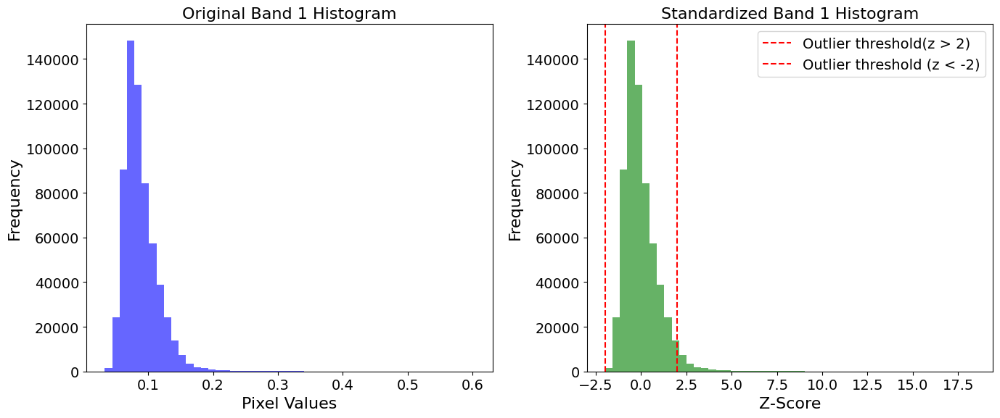

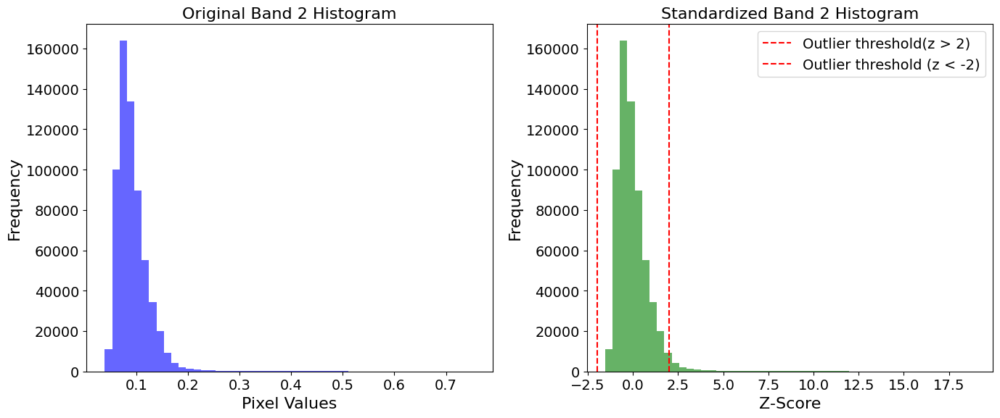

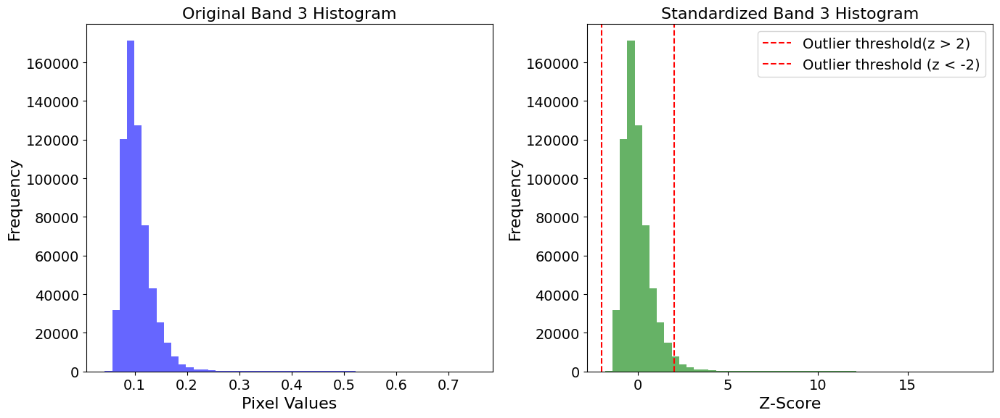

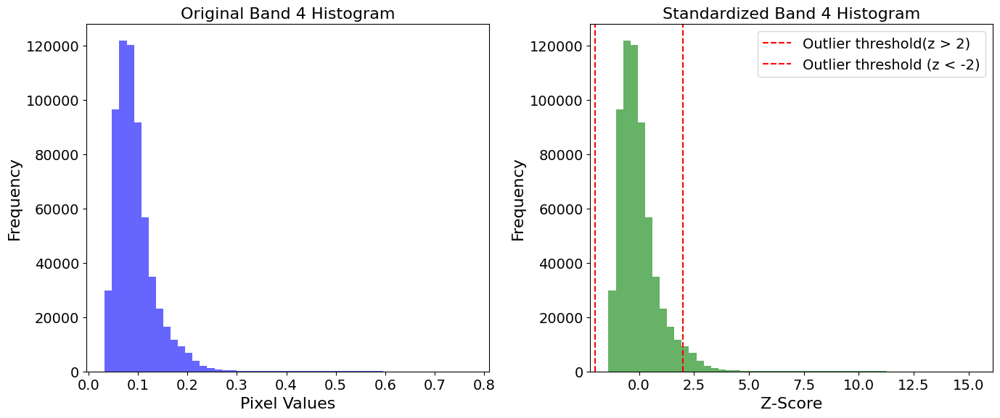

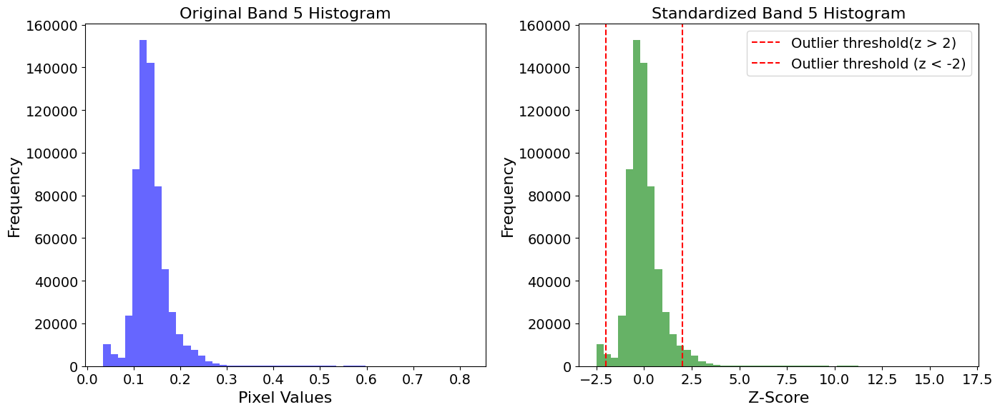

...

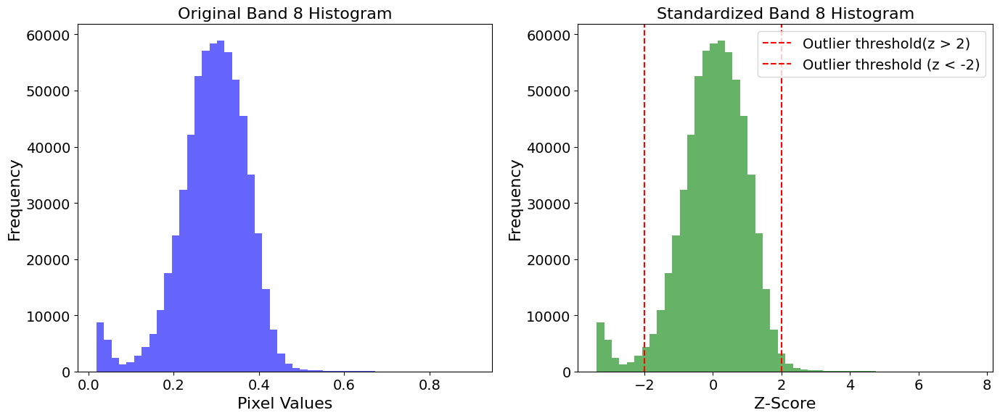

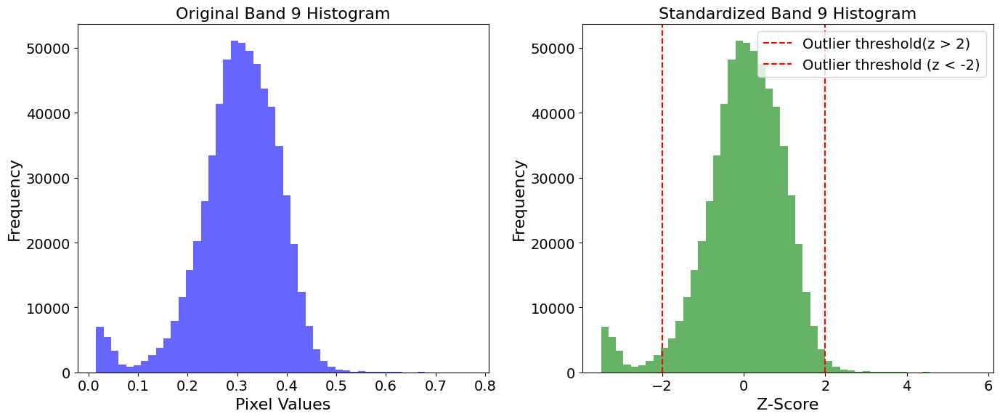

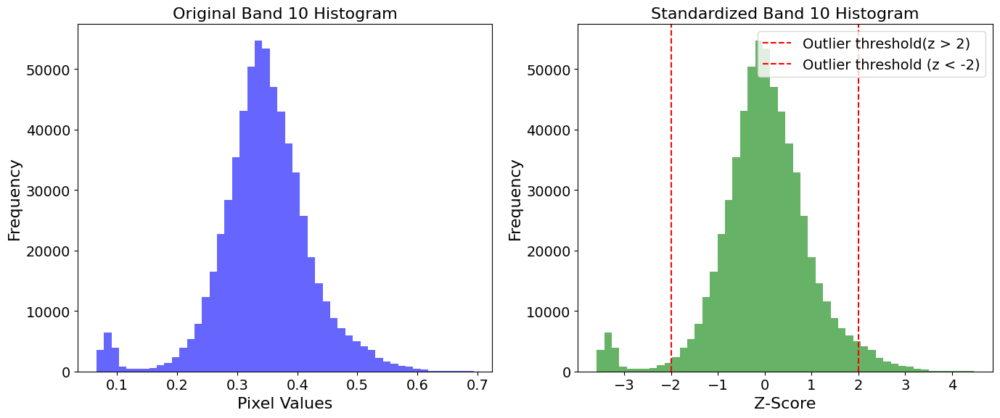

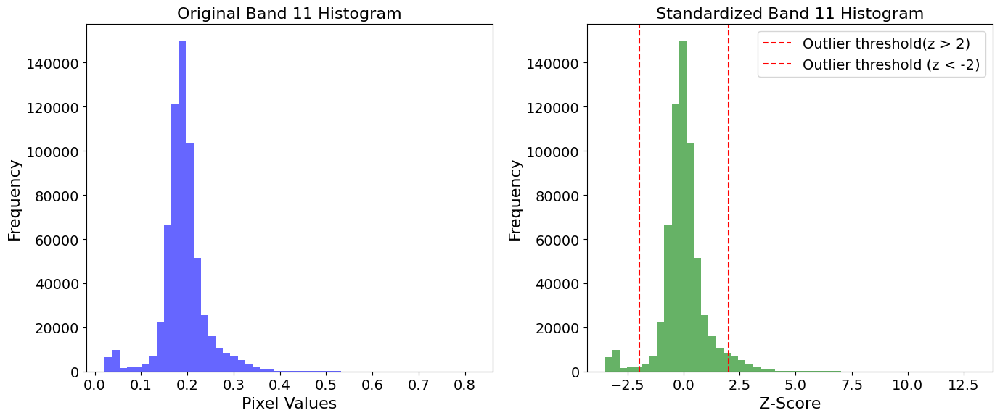

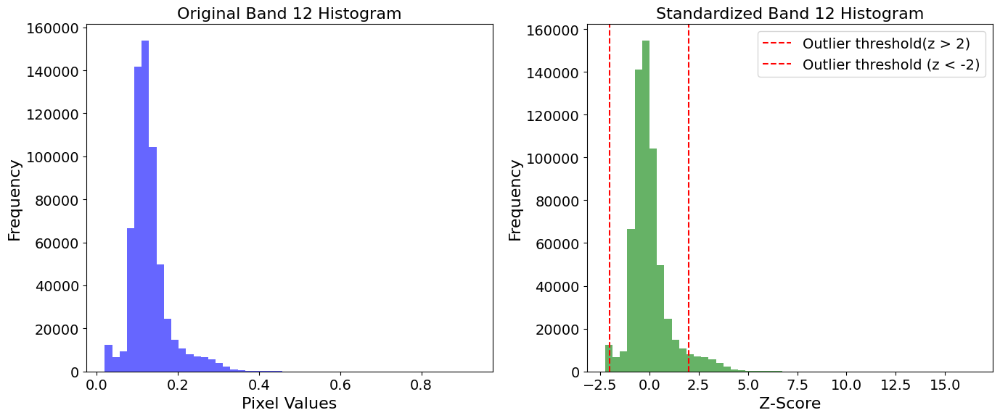

In [8]:
## 2.b Standarize the data using z-score

def standardize_band(band_data):
    """
    Standardizes single band data using z-scores
    """
    mean_val = np.nanmean(band)  
    std_val = np.nanstd(band)    
    z_scores = (band - mean_val) / std_val  

    return z_scores

## Plotting histogram for all Bandas

def plot_histograms(original_band_data, standardized_band_data, band_idx):

    fig, axs = plt.subplots(1, 2, figsize=(14, 6))
    
    # Histogram for original band data
    axs[0].hist(original_band_data.flatten(), bins=50, color='blue', alpha=0.6)
    axs[0].set_title(f"Original Band {band_idx+1} Histogram")
    axs[0].set_xlabel("Pixel Values")
    axs[0].set_ylabel("Frequency")
    
    # Histogram for standarized data
    axs[1].hist(standardized_band_data.flatten(), bins=50, color='green', alpha=0.6)
    axs[1].set_title(f"Standardized Band {band_idx+1} Histogram")
    axs[1].set_xlabel("Z-Score")
    axs[1].set_ylabel("Frequency")
    
    # Outliers are if z>3 or z<-3
    outliers = standardized_band[np.abs(standardized_band) > 3]
    axs[1].axvline(2, color='red', linestyle='--', label="Outlier threshold(z > 2)")
    axs[1].axvline(-2, color='red', linestyle='--', label="Outlier threshold (z < -2)")
    axs[1].legend()
    plt.tight_layout()
    plt.show()

# Plot for all bands both original and standarized data
for band_idx in range(Sen2roc_nanadded.shape[2]):  
    band = Sen2roc_nanadded[:, :, band_idx]
    standardized_band = standardize_band(band)
    plot_histograms(band, standardized_band, band_idx)

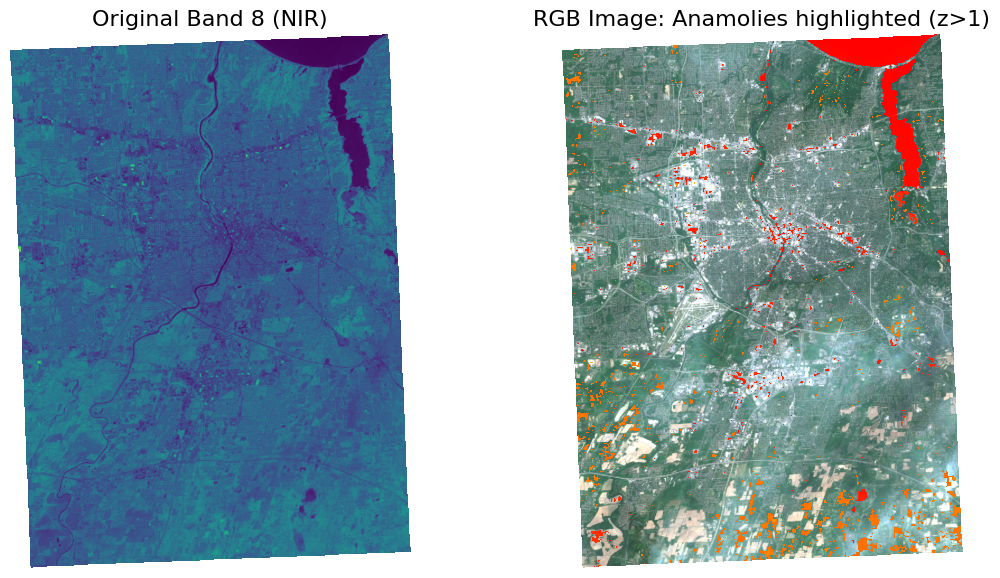

In [9]:
## Exmple Showing Anamolies in Band Image---> Showing for NIR band (Band 8)

# Function definition
def highlight_anomalies(band_data, thresh):

    # Flatten the band and calculate z-scores
    flattened_band = band_data.flatten()
    band_zscores = standardize_band(flattened_band)
    
    # Regain original shape of the image
    zscore_reshaped = band_zscores.reshape(band_data.shape)
    
    # Masking the anamolies (absolute z-score > some threshold)
    mask = np.abs(zscore_reshaped) > thresh

    return mask

# Example visualization:
thresh = 1
band = Sen2roc_nanadded[:, :, 7] 
anomaly_mask = highlight_anomalies(band, thresh)  # threshold of 1

# Plot the ouliers
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Original band
axes[0].imshow(band, cmap='viridis')
axes[0].set_title("Original Band 8 (NIR)")
axes[0].axis('off')

# Anomalies Highlighted RGB image
anomalous_band = np.ma.masked_where(~anomaly_mask, band)  # Mask non-anomalous pixels
rgb_after[Sen2_roc[:,:,7] == 0] = np.nan
axes[1].imshow(rgb_after)
axes[1].imshow(anomalous_band, cmap='autumn', alpha=1)  # Highlight outliers in red
axes[1].set_title(f"RGB Image: Anamolies highlighted (z>{thresh})")
axes[1].axis('off')
plt.tight_layout()
plt.show()


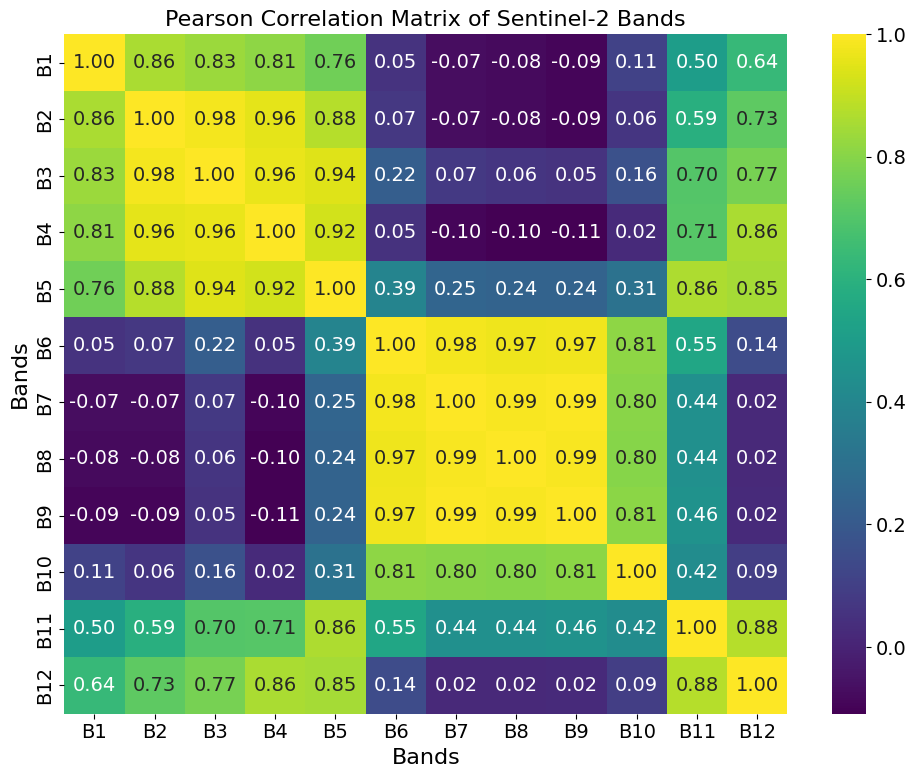

In [10]:
## 3.a Exploring Variable Relationships 
 
# Pearson correlation matrix:

def correlation_matrix(band_data):

    bands = band_data.shape[2]
    reshaped_data = band_data.reshape(-1, bands)  # Flatten rows and columns, keeping bands
    reshaped_data = reshaped_data[~np.isnan(reshaped_data).any(axis=1)]  # Remove NaN rows
    corr_matrix = np.corrcoef(reshaped_data, rowvar=False)
    return corr_matrix

# Compute the correlation matrix for Sentinel-2 data
correlation_matrix = correlation_matrix(Sen2roc_nanadded)

# Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="viridis", cbar=True,
            xticklabels=[f'B{i+1}' for i in range(Sen2roc_nanadded.shape[2])],
            yticklabels=[f'B{i+1}' for i in range(Sen2roc_nanadded.shape[2])])
plt.title("Pearson Correlation Matrix of Sentinel-2 Bands")
plt.xlabel("Bands")
plt.ylabel("Bands")
plt.tight_layout()
plt.show()

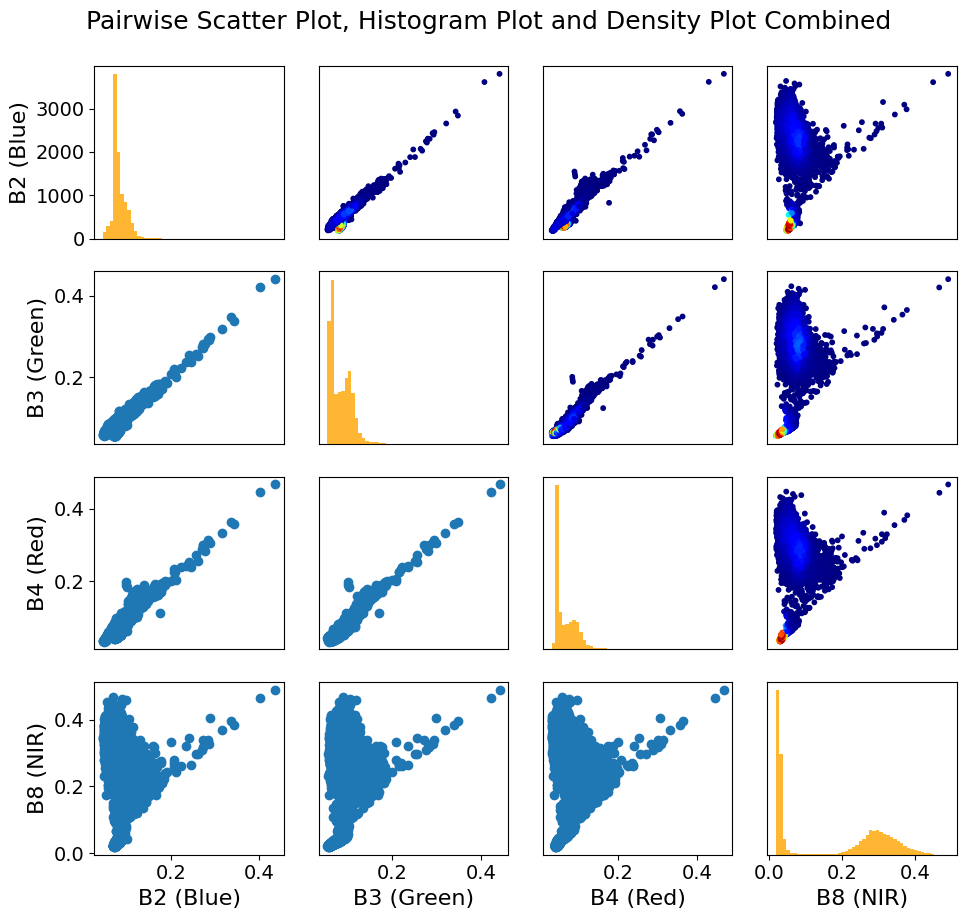

In [11]:
## 3b. Scatter and Density plot

def correlation_plot(band_data, band_names):

    num_bands = len(band_data)
    fig, axes = plt.subplots(num_bands, num_bands, figsize=(10, 10))
    fig.suptitle("Pairwise Scatter Plot, Histogram Plot and Density Plot Combined", y=0.92)

    ## For all Bands
    for i in range(num_bands):
        for j in range(num_bands):
            ax = axes[i, j]

            # Plot Histogram in Diagonal
            if i == j:
                ax.hist(band_data[i], bins=50, color='orange', alpha=0.8)

            # Density plot in upper triangle--> Using Gaussian KDE
            elif i < j:
                x = band_data[i]
                y = band_data[j]
                xy = np.vstack([x, y])
                density = gaussian_kde(xy)(xy)
                ax.scatter(x, y, c=density, cmap='jet', s=10)

            # Scatter Plot in Lower Triangle
            elif i > j:
                ax.scatter(band_data[j], band_data[i])

            # Cleaner Visuals
            if j != 0:
                ax.set_yticks([])
            if i != num_bands - 1:              ## Remove ticks
                ax.set_xticks([])

            if i == num_bands - 1:
                ax.set_xlabel(band_names[j])       ## Name/Label only on
            if j == 0:
                ax.set_ylabel(band_names[i])

    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()


# Example Visual:
# Extracting and cleaning the 10m bands
B2 = Sen2roc_nanadded[:, :, 1].flatten()
B3 = Sen2roc_nanadded[:, :, 2].flatten()
B4 = Sen2roc_nanadded[:, :, 3].flatten()
B8 = Sen2roc_nanadded[:, :, 7].flatten()

# Removing NaNs
B2_clean = B2[~np.isnan(B2)][:10000]
B3_clean = B3[~np.isnan(B3)][:10000]
B4_clean = B4[~np.isnan(B4)][:10000]
B8_clean = B8[~np.isnan(B8)][:10000]

# Prepare data and labels
band_data = [B2_clean, B3_clean, B4_clean, B8_clean]
band_names = ["B2 (Blue)", "B3 (Green)", "B4 (Red)", "B8 (NIR)"]

# Calling the function
correlation_plot(band_data, band_names)

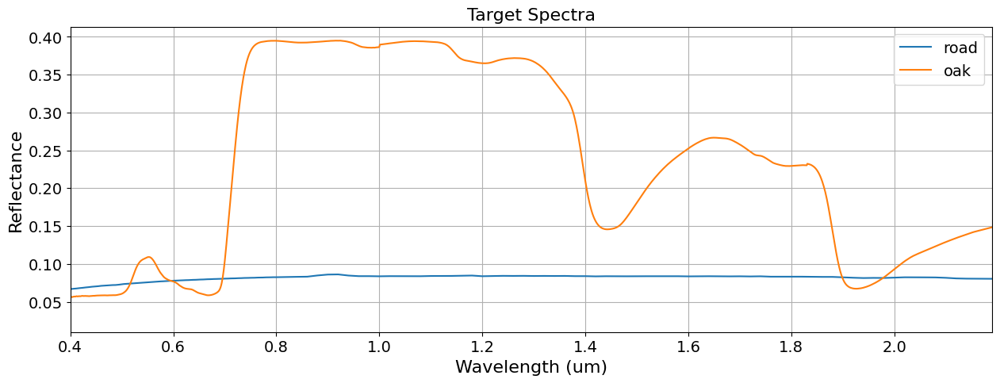

In [12]:
## 4.a Spectral Matching:

# There is no 1375nm band (band 10) in the data if i understand the notes correctly
# So, available bands after removing atmospheric water absorption and aerosols (443nm (B1) and 940nm (B9) bands) are:

Sentinel2_bands = [0.490, 0.560, 0.665, 0.705, 0.740, 0.783, 0.842, 0.865, 1.610, 2.190] ## VIS-to-SWIR (microns)

# And filtering the imagery for these bands the image with remaining bands is:
Sentinal_image_filtered = np.delete(Sen2roc_nanadded, [0, 9], axis=2)

# Read the Oak and Road reflectance data

road = pd.read_csv('construction_asphalt.txt', delimiter='\t', skiprows=2, names=['wavelength', 'reflectance'])
oak = pd.read_csv('quercus_agrifolia.txt', delimiter='\t', skiprows=2, names=['wavelength', 'reflectance'])

## convert to absolute reflectance from percentage reflcatnce

road['reflectance'] = road['reflectance']/100
oak['reflectance'] = oak['reflectance']/100

## Plot the Spectra
plt.figure(figsize=(15,5))
plt.plot(road['wavelength'],road['reflectance'], label='road')
plt.plot(oak['wavelength'], oak['reflectance'], label = 'oak')
plt.xlabel('Wavelength (um)')
plt.ylabel('Reflectance')
plt.title('Target Spectra')
plt.grid(which='both')
plt.xlim(0.4, 2.19)
plt.legend()
plt.show()

In [13]:
Sentinal_image_filtered.shape

(954, 716, 10)

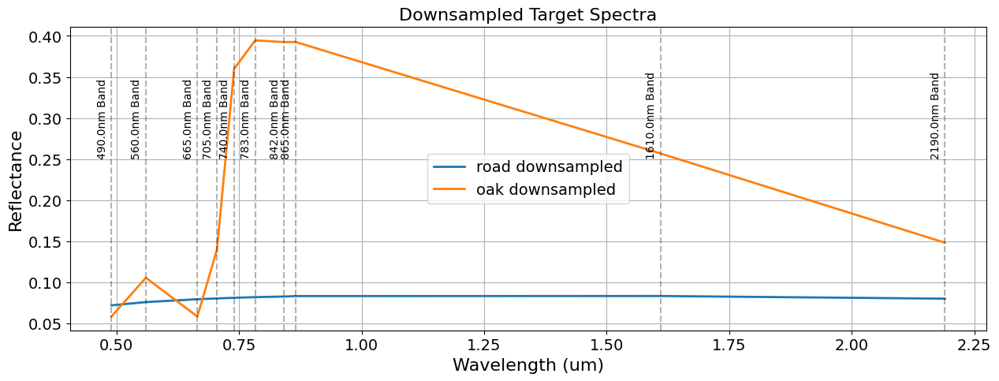

In [14]:
## 4.b Downsampling the reflectances to match the sentinal 2 bands

def downsample_wavelengths(wavelengths, reflectance, sentinel_bands):

    return np.interp(sentinel_bands, wavelengths, reflectance)

# Downsample Road and Oak reflectances
road_downsampled = downsample_wavelengths(road['wavelength'], road['reflectance'], Sentinel2_bands)
oak_downsampled = downsample_wavelengths(oak['wavelength'], oak['reflectance'], Sentinel2_bands)

# Plot the downsampled spectra
plt.figure(figsize=(15,5))
plt.plot(Sentinel2_bands, road_downsampled, label='road downsampled', linewidth=2)
plt.plot( Sentinel2_bands, oak_downsampled, label = 'oak downsampled', linewidth=2)
for idx, band in enumerate(Sentinel2_bands):
    plt.axvline(band, linestyle='dashed', color='k', alpha=0.3)
    plt.text(band-0.03, 0.25, f'{band*1000}nm Band', rotation=90, verticalalignment='bottom', fontsize=10)
plt.xlabel('Wavelength (um)')
plt.ylabel('Reflectance')
plt.grid(which='both')
plt.title('Downsampled Target Spectra')
plt.legend()
plt.show()

In [15]:
## 4c. Finding the closet match pixels

# Spectral Angle Mapper (Cosine Similarity)
def SAM(v1, v2):
    dot_product = np.dot(v1, v2)
    norm1 = np.linalg.norm(v1)
    norm2 = np.linalg.norm(v2)
    angle = np.arccos(dot_product / (norm1 * norm2))  # Radians angle
    return angle

# Target Spectra
road_spectrum = np.array(road_downsampled)
oak_spectrum = np.array(oak_downsampled)

# Flatten Sentinel2 Data
num_rows, num_cols, num_bands = Sentinal_image_filtered.shape
pixels = Sentinal_image_filtered.reshape(-1, num_bands)

# caclulate cosine similarity for each pixel
road_angles = np.array([SAM(pixel, road_spectrum) for pixel in pixels])
oak_angles = np.array([SAM(pixel, oak_spectrum) for pixel in pixels])

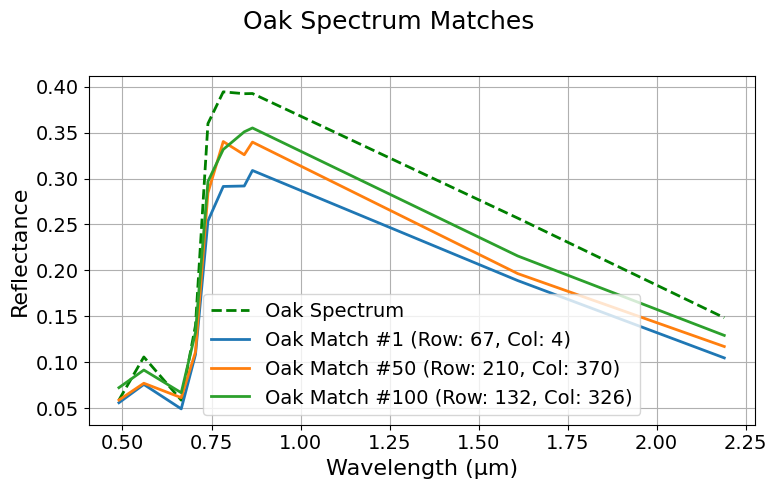

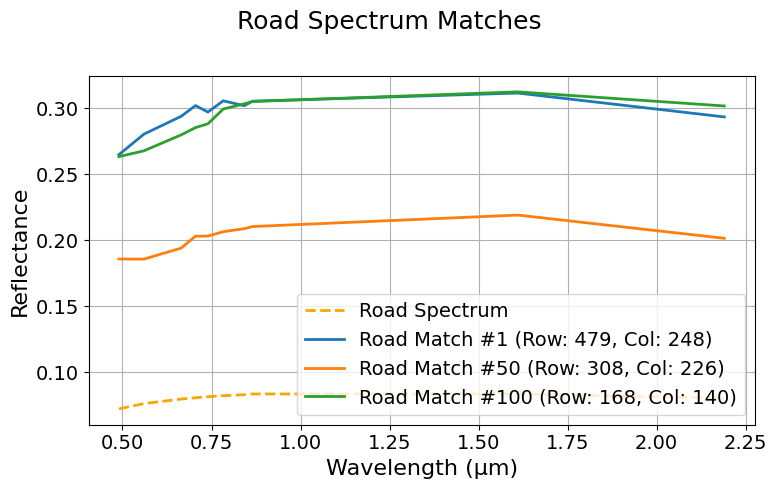

In [22]:
## 4c.1 --> Showing top matches

# Sorting top 100 angles
road_top_indices = np.argsort(road_angles)[:100]
oak_top_indices = np.argsort(oak_angles)[:100]

# Reshape indices back to (row, col) format --> to locate the pixel in original image
road_top_pixels = np.unravel_index(road_top_indices, (num_rows, num_cols))
oak_top_pixels = np.unravel_index(oak_top_indices, (num_rows, num_cols))

# Oak Spectrum Match 
fig_oak, ax_oak = plt.subplots(figsize=(8, 5))
fig_oak.suptitle("Oak Spectrum Matches")

# Plot Sentinel2 Spectral (downsampled) and Top 1st, 50th, and 100th Oak Matches
indices_oak = [0, 49, 99]
ax_oak.plot(Sentinel2_bands, oak_downsampled, label='Oak Spectrum', color='green', linestyle='dashed', linewidth=2)

for i, idx in enumerate(indices_oak): 
    row, col = oak_top_pixels[0][idx], oak_top_pixels[1][idx]   # Select from top_indices
    pixel_spectrum = Sentinal_image_filtered[row, col, :]
    ax_oak.plot(Sentinel2_bands, pixel_spectrum, label=f'Oak Match #{idx + 1} (Row: {row}, Col: {col})', linewidth=2)
ax_oak.set_xlabel('Wavelength (μm)')
ax_oak.set_ylabel('Reflectance')
ax_oak.legend()
ax_oak.grid(True)
fig_oak.tight_layout(rect=[0, 0, 1, 0.98])  
plt.show()

# Road Spectrum Match
fig_road, ax_road = plt.subplots(figsize=(8, 5))
fig_road.suptitle("Road Spectrum Matches")

# Plot Sentinel2 Spectral (downsampled) and Top 1st, 50th, and 100th Road Matches
indices_road = [0, 49, 99]
ax_road.plot(Sentinel2_bands, road_downsampled, label='Road Spectrum', color='orange', linestyle='dashed', linewidth=2)

for i, idx in enumerate(indices_road):  
    row, col = road_top_pixels[0][idx], road_top_pixels[1][idx]
    pixel_spectrum = Sentinal_image_filtered[row, col, :]
    ax_road.plot(Sentinel2_bands, pixel_spectrum, label=f'Road Match #{idx + 1} (Row: {row}, Col: {col})', linewidth=2)
ax_road.set_xlabel('Wavelength (μm)')
ax_road.set_ylabel('Reflectance')
ax_road.legend()
ax_road.grid(True)
fig_road.tight_layout(rect=[0, 0, 1, 0.98])  
plt.show()


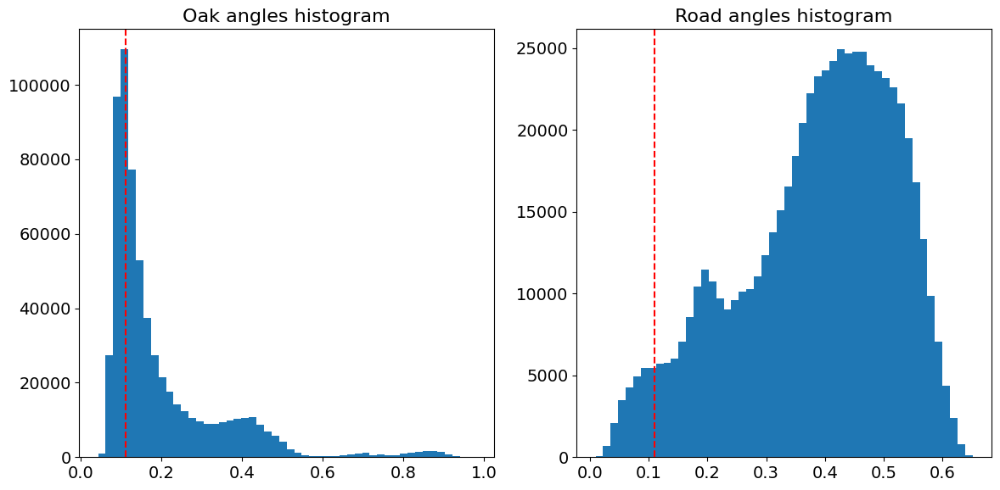

In [17]:
## 4b. Finding best matches in the imagery

## Plot the histogram of SAM

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Manual selection of the thresholds based on visuals
oak_threshold = 0.11
road_threshold = 0.15

# Oak
axes[0].hist(oak_angles, bins=50)
axes[0].axvline(oak_threshold, linestyle='dashed', color='red', label='threshold')
axes[0].set_title("Oak angles histogram")

# Road
axes[1].hist(road_angles, bins=50)
axes[1].axvline(oak_threshold, linestyle='dashed', color='red', label='threshold')
axes[1].set_title(f"Road angles histogram")
plt.tight_layout()
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


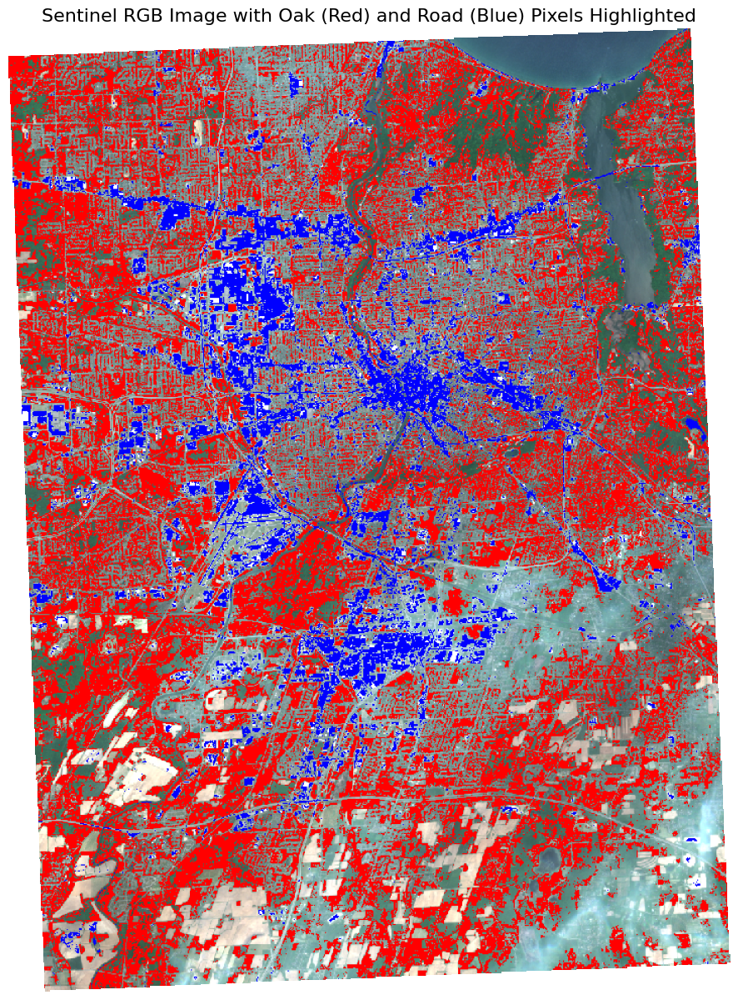

In [18]:
## 4c. Showing in the image:

# Create binary masks based on thresholds for Oak and Road
oak_mask = oak_angles <= oak_threshold
road_mask = road_angles <= road_threshold

# Create a copy of the Sentinel RGB image to visualize the results
highlighted_image = rgb_after.copy()

# Highlight Oak pixels (red color)
highlighted_image[oak_mask.reshape(954, 716)] = [255, 0, 0]  # Red for Oak pixels

# Highlight Road pixels (blue color)
highlighted_image[road_mask.reshape(954, 716)] = [0, 0, 255]  # Blue for Road pixels

# Plot the Sentinel RGB image with highlighted Oak and Road pixels
plt.figure(figsize=(20, 15))
plt.imshow(highlighted_image)
plt.title('Sentinel RGB Image with Oak (Red) and Road (Blue) Pixels Highlighted')
plt.axis('off')  
plt.show()